# Projet 6 : Classification des biens de consommation
## Partie 2 : Etude de faisabilité à partir d'images

In [1]:
import os
from os import listdir

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import ShuffleSplit
from sklearn.metrics import accuracy_score, auc, roc_auc_score, roc_curve, silhouette_score
from sklearn import cluster ,manifold, decomposition ,preprocessing ,metrics
from sklearn.cluster import KMeans, MiniBatchKMeans

In [4]:
from PIL import Image, ImageOps ,ImageFilter
from matplotlib.image import imread
import cv2 as cv

In [5]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [6]:
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalAveragePooling1D, Flatten, Dense, Dropout 
from tensorflow.keras.layers import Rescaling, RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from tensorflow.keras.utils import to_categorical

from glob import glob
os.environ["TF_KERAS"]='1'
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

2023-05-21 21:22:54.729852: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-21 21:22:55.622382: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Num GPUs Available:  1


2023-05-21 21:22:56.662823: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-21 21:22:56.973662: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-21 21:22:56.973853: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

In [7]:
from pandarallel import pandarallel
pandarallel.initialize(progress_bar=True, nb_workers=7,) #verbose=1

INFO: Pandarallel will run on 7 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [8]:
pd.set_option("display.max_colwidth", 150)

### Chargement de données néttoyées préalablement

In [9]:
flipkart=pd.read_csv("./data/data_1/flipkart_sample_1050_cleaned.csv")

In [10]:
#Répértoire d'images
path = "./data/data_1/Images/"

In [11]:
flipkart["image_path"] = path + flipkart['image']

In [12]:
flipkart.sample(5)

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3,label,image_path
1022,7ec5ac2dea80b6c5e4cfd20eba597d20,2016-03-03 06:06:42 +0000,http://www.flipkart.com/aroma-comfort-polyester-brown-floral-eyelet-long-door-curtain/p/itmefqf6ewktk6rq?pid=CRNEFQF6GZF9ZCZQ,Aroma Comfort Polyester Brown Floral Eyelet Long Door Curtain,CRNEFQF6GZF9ZCZQ,699.0,599.0,7ec5ac2dea80b6c5e4cfd20eba597d20.jpg,False,"Key Features of Aroma Comfort Polyester Brown Floral Eyelet Long Door Curtain Height: 274 cm Width: 4 inch,Specifications of Aroma Comfort Polyest...",No rating available,No rating available,Aroma Comfort,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Aroma Comfort""}, {""key""=>""Designed For"", ""value""=>""Long Door""}, {""key""=>""Type"", ""value""=>""Ey...",Home Furnishing,Curtains & Accessories,Curtains,4,./data/data_1/Images/7ec5ac2dea80b6c5e4cfd20eba597d20.jpg
249,0131e5d87b72877702d536299cf83b75,2015-12-01 12:40:44 +0000,http://www.flipkart.com/sumeet-hard-anodised-14-kadhai-3-l/p/itme3kkx6pzmtdq8?pid=PTPE3KKXGM4XTGKF,Sumeet Hard Anodised 14 Kadhai 3 L,PTPE3KKXGM4XTGKF,1760.0,1045.0,0131e5d87b72877702d536299cf83b75.jpg,False,Buy Sumeet Hard Anodised 14 Kadhai 3 L for Rs.1045 online. Sumeet Hard Anodised 14 Kadhai 3 L at best prices with FREE shipping & cash on delivery...,No rating available,No rating available,Sumeet,"{""product_specification""=>[{""key""=>""Pan Type"", ""value""=>""Fry""}, {""key""=>""Non-stick"", ""value""=>""No""}, {""key""=>""Brand"", ""value""=>""Sumeet""}, {""key""=>...",Kitchen & Dining,Cookware,Pots & Pans,5,./data/data_1/Images/0131e5d87b72877702d536299cf83b75.jpg
574,a1a266a37d38f7ce41d11f1868d8c9bf,2016-01-07 05:50:25 +0000,http://www.flipkart.com/neo-classic-nc11-5004-w-analog-watch-women/p/itmdp2nz5wecf7hg?pid=WATDNA7SYSHZJ9PA,Neo Classic NC11-5004_W Analog Watch - For Women,WATDNA7SYSHZJ9PA,795.0,795.0,a1a266a37d38f7ce41d11f1868d8c9bf.jpg,False,Neo Classic NC11-5004_W Analog Watch - For Women - Buy Neo Classic NC11-5004_W Analog Watch - For Women NC11-5004_W Online at Rs.795 in India O...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""value""=>""Analog""}, {""key""=>""Style Code"", ""value""=>""NC11-5004_W""}, {""key""=>""Ideal For"", ""value""=>""Women...",Watches,Wrist Watches,Neo Classic Wrist Watches,6,./data/data_1/Images/a1a266a37d38f7ce41d11f1868d8c9bf.jpg
30,788dc3a3da91c0f46a7c465e07f91dd4,2015-12-04 07:25:36 +0000,http://www.flipkart.com/marvel-dw100243-digital-watch-boys-girls/p/itme3gezjyzdheff?pid=WATE3GEYE8JQT7WM,"Marvel DW100243 Digital Watch - For Boys, Girls",WATE3GEYE8JQT7WM,299.0,299.0,788dc3a3da91c0f46a7c465e07f91dd4.jpg,False,"Marvel DW100243 Digital Watch - For Boys, Girls - Buy Marvel DW100243 Digital Watch - For Boys, Girls DW100243 Online at Rs.299 in India Only a...",4,4,NaN,"{""product_specification""=>[{""key""=>""Type"", ""value""=>""Digital""}, {""key""=>""Style Code"", ""value""=>""DW100243""}, {""key""=>""Ideal For"", ""value""=>""Boys, G...",Watches,Wrist Watches,Marvel Wrist Watches,6,./data/data_1/Images/788dc3a3da91c0f46a7c465e07f91dd4.jpg
330,394c2c627914e1eed9b8ac343583a679,2015-12-01 06:13:00 +0000,http://www.flipkart.com/asus-rt-n12-lx-300mbps-wireless-router/p/itmd6354btvnrxtz?pid=RTRD6352VX7RZSWG,Asus RT-N12 LX 300Mbps Wireless Router,RTRD6352VX7RZSWG,3950.0,1990.0,394c2c627914e1eed9b8ac343583a679.jpg,False,Buy Asus RT-N12 LX 300Mbps Wireless Router only for Rs. 4200 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping...,4.1,4.1,Asus,"{""product_specification""=>[{""key""=>""Firewall"", ""value""=>""NAT, SPI (Stateful Packet Inspection)""}, {""key""=>""Encryption"", ""value""=>""64-bit WEP, 128-...",Computers,Network Components,Routers,2,./data/data_1/Images/394c2c627914e1eed9b8ac343583a679.jpg


In [13]:
flipkart.iloc[0][['image','image_path']]

image                              55b85ea15a1536d46b7190ad6fff8ce7.jpg
image_path    ./data/data_1/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg
Name: 0, dtype: object

In [14]:
df_image_par_cat = flipkart.groupby('cat_lvl_1').agg({'image' : 'count'})
df_image_par_cat

,image
cat_lvl_1,
Baby Care,150
Beauty and Personal Care,150
Computers,150
Home Decor & Festive Needs,150
Home Furnishing,150
Kitchen & Dining,150
Watches,150


- 150 images par catégories

In [15]:
#DataFrame ne contenant que les champs nécessaire aux traitement d'images
df_img = flipkart[['image', 'image_path','cat_lvl_1','label']]
df_img.sample(5)

,image,image_path,cat_lvl_1,label
816,b362b56f7ee80dcfe9d8bb643df87007.jpg,./data/data_1/Images/b362b56f7ee80dcfe9d8bb643df87007.jpg,Home Decor & Festive Needs,3
703,3f9f12fa8fc6d7ebef136040f179a201.jpg,./data/data_1/Images/3f9f12fa8fc6d7ebef136040f179a201.jpg,Home Furnishing,4
842,de47d0cc0c4875fb97530f66d934c894.jpg,./data/data_1/Images/de47d0cc0c4875fb97530f66d934c894.jpg,Computers,2
429,9fb8662af03c957ade34d4c816d4e903.jpg,./data/data_1/Images/9fb8662af03c957ade34d4c816d4e903.jpg,Computers,2
354,c8e2c85eccdc9db55eeb2231385e4f1c.jpg,./data/data_1/Images/c8e2c85eccdc9db55eeb2231385e4f1c.jpg,Computers,2


In [16]:
def list_images_cat(col, name, path) :
    """
    Permet de séléctionner les images selon une catégorie
    
    positional arguments :
    ----------------------
    col : str : niveau des catégories
    name : str : catégorie
    path : str : répértoire d'images
    
    return :
    ------------------------
    liste d'images par catégorie
    
    """
    
    list_image_name = [flipkart[path][i] for i in range(len(flipkart)) if flipkart[col][i]==name]
    return list_image_name

Home Furnishing


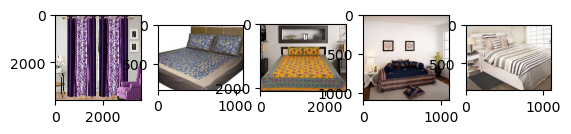

Baby Care


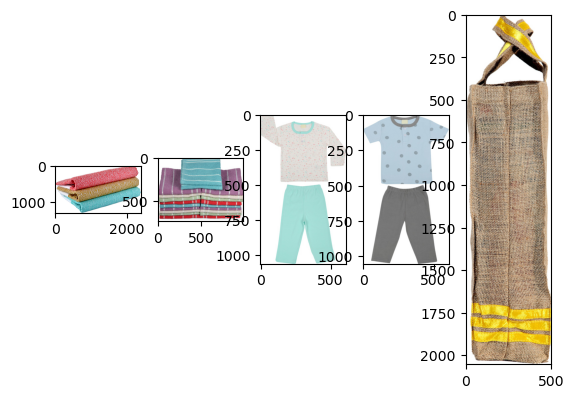

Watches


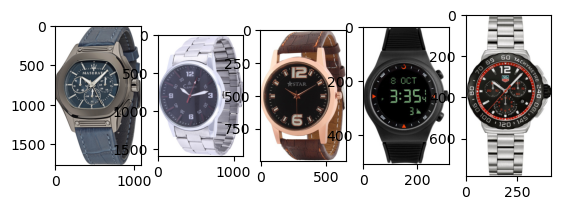

Home Decor & Festive Needs


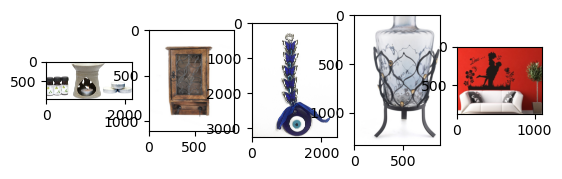

Kitchen & Dining


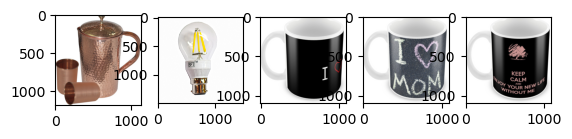

Beauty and Personal Care


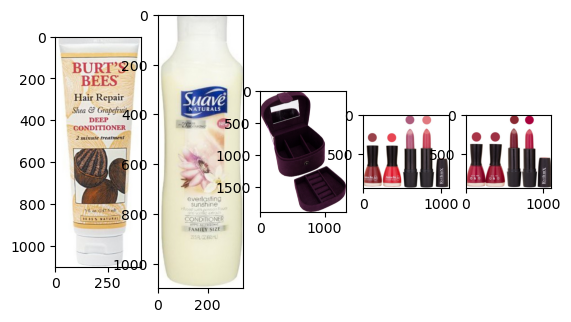

Computers


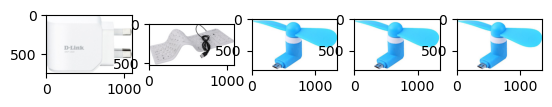

In [17]:
#Affichage images avec dimensions
labels_name = flipkart.cat_lvl_1.value_counts().index
for name in labels_name :
    bolded_name = "\033[1m" + name + "\033[0m"
    print(bolded_name)
    # print("-------")
    for i in range(5):
        plt.subplot(150 + 1 + i)
        filename = list_images_cat('cat_lvl_1', name, 'image_path')[i]
        image = imread(filename)
        plt.imshow(image)
        #plt.axis('off')
    plt.show()

Home Furnishing


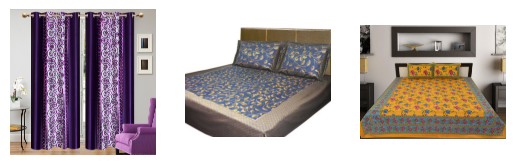

Baby Care


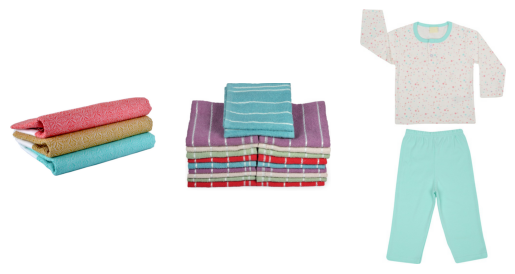

Watches


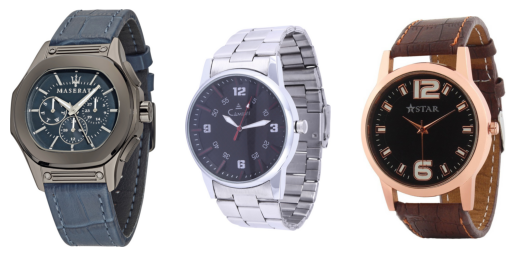

Home Decor & Festive Needs


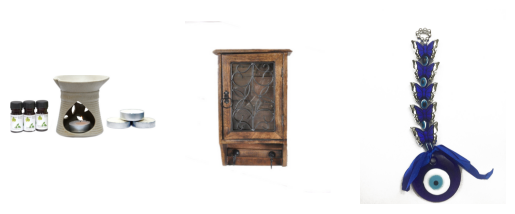

Kitchen & Dining


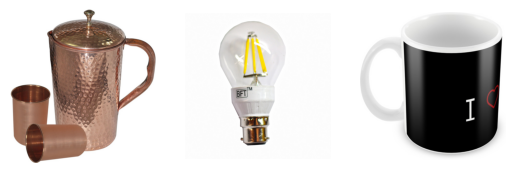

Beauty and Personal Care


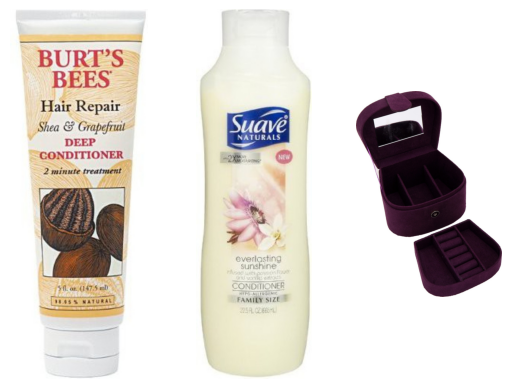

Computers


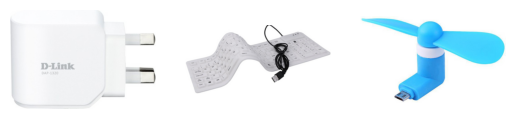

In [18]:
# affichage des images sans dimensions

for j, categ in enumerate(df_img["cat_lvl_1"].unique()) :
    bolded_string = "\033[1m" + categ + "\033[0m"
    print(bolded_string)
    # print("-------")
    for i in range(3):
        name_image = df_img[df_img["cat_lvl_1"] == categ]["image"].iloc[i]
        plt.subplot(130 + 1 + i)
        filename = path + name_image
        img = imread(filename)
        plt.imshow(img)
        plt.axis('off')    
    plt.show() 

### Déscription des images : Largeur, hauteur, taille et format

In [19]:
# Largeur des images
df_img.loc[:]['Largeur_img'] = [Image.open(row).size[0] for row in df_img.loc[:,'image_path']]
# Hauteur des images
df_img.loc[:]['Hauteur_img'] = [Image.open(row).size[1] for row in df_img.loc[:,'image_path']]
# Taille des images
df_img.loc[:]['Taille_img'] = [(Image.open(row).size[0] * Image.open(row).size[1])
                        for row in df_img.loc[:,'image_path']]
# Format des images
df_img.loc[:]['Format_img'] = [Image.open(row).mode for row in df_img.loc[:,'image_path']]


/home/mel/anaconda3/lib/python3.9/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/mel/anaconda3/lib/python3.9/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/mel/anaconda3/lib/python3.9/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/mel/anaconda3/lib/python3.9/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


In [20]:
# Largeur des images
df_img['Largeur_img'] = [Image.open(row).size[0] for row in df_img.loc[:,'image_path']]
# Hauteur des images
df_img['Hauteur_img'] = [Image.open(row).size[1] for row in df_img.loc[:,'image_path']]
# Taille des images
df_img['Taille_img'] = [(Image.open(row).size[0] * Image.open(row).size[1])
                        for row in df_img.loc[:,'image_path']]
# Format des images
df_img['Format_img'] = [Image.open(row).mode for row in df_img.loc[:,'image_path']]

/home/mel/anaconda3/lib/python3.9/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/tmp/ipykernel_177651/3604506649.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_img['Largeur_img'] = [Image.open(row).size[0] for row in df_img.loc[:,'image_path']]
/home/mel/anaconda3/lib/python3.9/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/tmp/ipykernel_177651/3604506649.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer

In [21]:
df_img[['cat_lvl_1','image','Largeur_img','Hauteur_img','Taille_img','Format_img']].sample(5)

,cat_lvl_1,image,Largeur_img,Hauteur_img,Taille_img,Format_img
789,Baby Care,389197b67a189c703f3deb9ca6f1f678.jpg,644,1024,659456,RGB
441,Beauty and Personal Care,f8aa59c4a170e8a90ae832b173b2b2d9.jpg,1536,1393,2139648,RGB
654,Baby Care,e1d8c5b60f9157f8e21c77cf795952f2.jpg,498,1100,547800,RGB
282,Baby Care,a8ea6fc2b3cd95f46bced80853ce8e0e.jpg,559,1373,767507,RGB
934,Home Furnishing,43da6e88dcb61e027ea9112cfab158ee.jpg,1640,1168,1915520,RGB


In [22]:
df_img[df_img['Taille_img'] > 89478485]

,image,image_path,cat_lvl_1,label,Largeur_img,Hauteur_img,Taille_img,Format_img
677,5518124b75d6c6dfee4c2e4c0cfa716a.jpg,./data/data_1/Images/5518124b75d6c6dfee4c2e4c0cfa716a.jpg,Kitchen & Dining,5,8484,11042,93680328,RGB


/home/mel/anaconda3/lib/python3.9/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


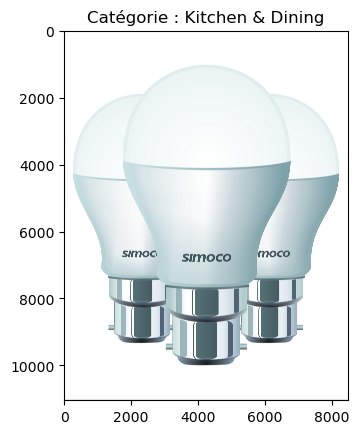

In [23]:
image = imread(df_img.iloc[677]['image_path'])
plt.imshow(image)
plt.title('Catégorie : '+df_img.iloc[677]['cat_lvl_1'])
plt.show()

### 1 Pré-traitement de toutes les images

In [24]:
def image_histopixel(image, titre):
    '''
    Afficher côte à côte l'image, l'histogramme de répartiton des pixels et l'histogramme cumulé des pixels.
    Parameters
    ----------
    image : image à afficher, obligatoire.
    Returns
    -------
    None.
    '''
    plt.figure(figsize=(40, 10))
    plt.subplot(131)
    plt.title(titre, fontsize=30)
    plt.imshow(image, cmap='gray')
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.subplot(132)
    plt.title('Histogramme de répartition des pixels', fontsize=30)
    hist, bins = np.histogram(np.array(image).flatten(), bins=256)
    plt.bar(range(len(hist[0:255])), hist[0:255])
    plt.xlabel('Niveau de gris', fontsize=30)
    plt.ylabel('Nombre de pixels', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.subplot(133)
    plt.title('Histogramme cumulé des pixels', fontsize=30)
    plt.hist(np.array(image).flatten(), bins=range(256), cumulative=True)
    plt.xlabel('Niveau de gris', fontsize=24)
    plt.ylabel('Fréquence cumulée de pixels', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.show()

In [25]:
dim = (224, 224)
dim_2 = (255, 255)

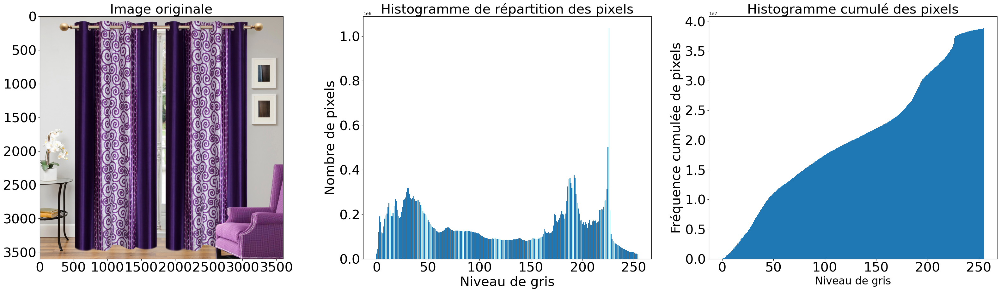

In [26]:
#Image originale
img_orig = Image.open(path+'/55b85ea15a1536d46b7190ad6fff8ce7.jpg')
image_histopixel(img_orig, 'Image originale')

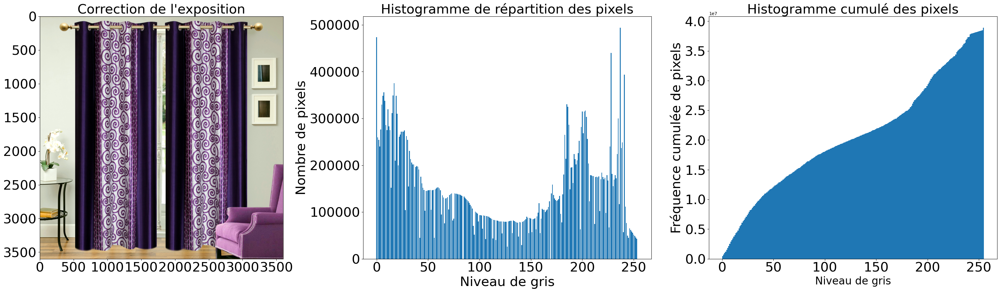

In [27]:
# Correction de l'exposition PILS
img_expo = ImageOps.autocontrast(img_orig, 1)
image_histopixel(img_expo, 'Correction de l\'exposition')

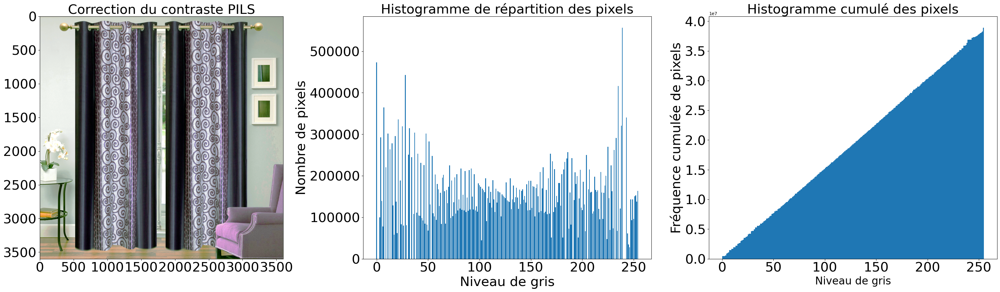

In [28]:
# Correction du contraste PILS
img_contr_pils = ImageOps.equalize(img_expo)
image_histopixel(img_contr_pils,'Correction du contraste PILS')

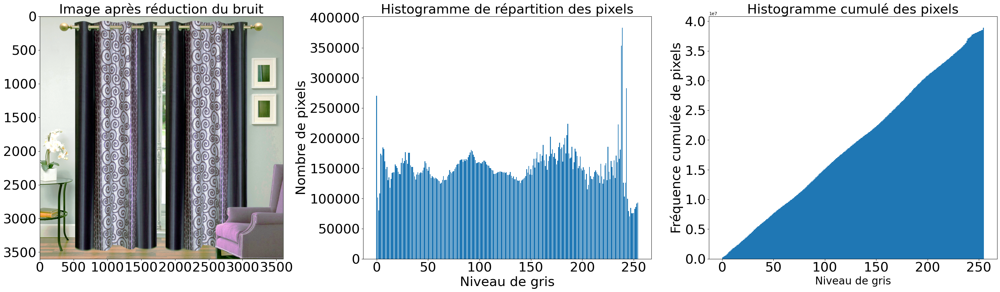

In [29]:
# Réduction du bruit (filtre)
img_filter = img_contr_pils.filter(ImageFilter.BoxBlur(1))
image_histopixel(img_filter,'Image après réduction du bruit')

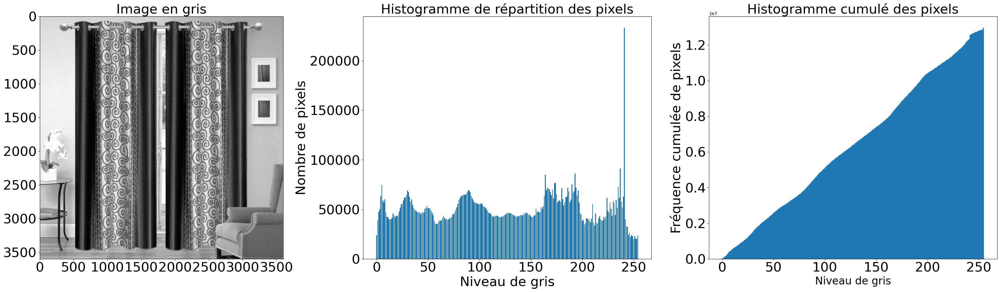

In [30]:
# Conversion de l'image en niveau de gris pour SIFT
img_gris = cv.cvtColor(np.array(img_filter), cv.COLOR_RGB2GRAY)
image_histopixel(img_gris,'Image en gris')

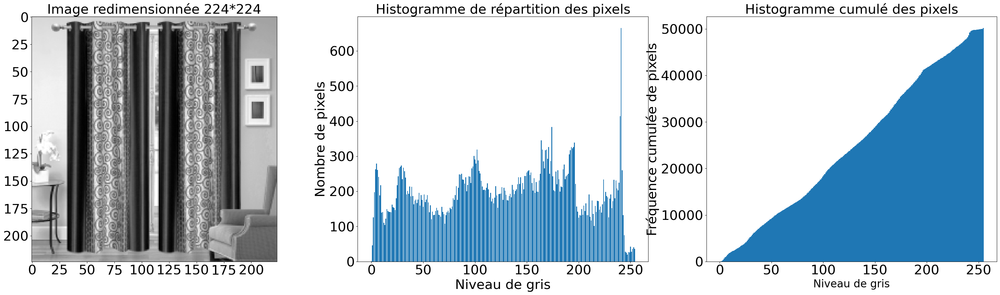

In [31]:
# Redimensionnement image contraste PILS
img_redim_pils = cv.resize(np.array(img_gris), dim,
                            interpolation=cv.INTER_AREA)
image_histopixel(img_redim_pils,'Image redimensionnée 224*224')

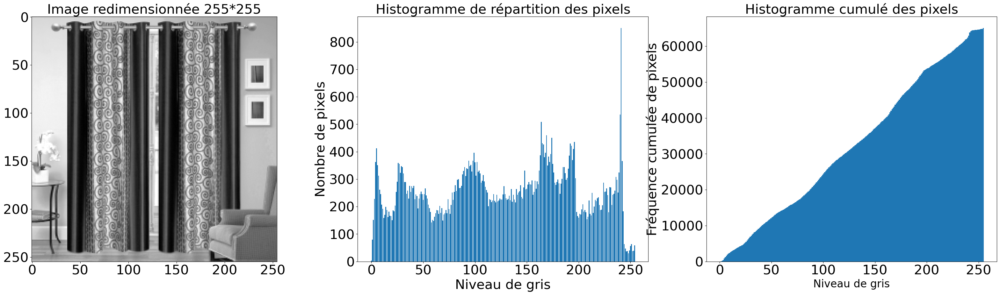

In [32]:
# Redimensionnement image contraste PILS
img_redim_pils = cv.resize(np.array(img_gris), dim_2,
                            interpolation=cv.INTER_AREA)
image_histopixel(img_redim_pils,'Image redimensionnée 255*255')

In [33]:
# Dossier images pre-traitées
path_preprocess_image = path + 'preprocess_image/'
# Dossier images pre-traitées en gris
path_preprocess_image_gray = path + 'preprocess_image_gray/'

### Fonction de pre-traitement d'images

In [34]:
def preprocess_images(image, dir_images_transformed, gray=None):
    '''
    le pré-traitement suivant est appliqué sur toutes les images :
    - Correction de l'exposition (étirement d'histogramme) 
    - Correction du contraste (égalisation d'histogramme)    
    - Réduction du bruit 
    - Conversion en niveau de gris de l'image (ORB, SIFT...).
    - Réduction de dimension
    Parameters
    ----------
    image : image localisée dans un répertoire, obligatoire.
    Returns
    -------
    None
    '''
    # Variables locales
    dim = (224, 224)
    dir_images_transformed = dir_images_transformed
    
    # Nom de l'image
    file_dir = os.path.split(image)

    # Chargement de l'image originale
    img = Image.open(image)

    # Correction de l'exposition PILS (étirement de l'histogramme)
    img = ImageOps.autocontrast(img, 1)

    # Correction du contraste (égalisation de l'histogramme)
    img = ImageOps.equalize(img)
    
    # Réduction du bruit 
    img = img.filter(ImageFilter.BoxBlur(1))
    
    # Conversion en niveau de gris de l'image
    if gray:
        img = cv.cvtColor(np.array(img), cv.COLOR_BGR2GRAY)
    
    # Redimensionnement en 224 * 224
    img = cv.resize(np.array(img), dim, interpolation=cv.INTER_AREA)

    # Sauvegarde de l'image dans le répertoire data/Images_process
    cv.imwrite(dir_images_transformed + file_dir[1], img)

    # Transforme un array en Image
    img = Image.fromarray(img) 
    
    # Sauvegarde de l'image dans le répertoire ../Flipkart/Images_process/
    img.save(os.path.join(dir_images_transformed, file_dir[1]))    
    
    return dir_images_transformed + file_dir[1]

In [35]:
# Pré-traitement de toutes les images
df_img.loc[:,'images_processed'] = df_img['image_path'].parallel_apply(preprocess_images,dir_images_transformed=path_preprocess_image)

/tmp/ipykernel_177651/646660660.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_img.loc[:,'images_processed'] = df_img['image_path'].parallel_apply(preprocess_images,dir_images_transformed=path_preprocess_image)


In [36]:
df_img['images_processed']

0       ./data/data_1/Images/preprocess_image/55b85ea15a1536d46b7190ad6fff8ce7.jpg
1       ./data/data_1/Images/preprocess_image/7b72c92c2f6c40268628ec5f14c6d590.jpg
2       ./data/data_1/Images/preprocess_image/64d5d4a258243731dc7bbb1eef49ad74.jpg
3       ./data/data_1/Images/preprocess_image/d4684dcdc759dd9cdf41504698d737d8.jpg
4       ./data/data_1/Images/preprocess_image/6325b6870c54cd47be6ebfbffa620ec7.jpg
                                           ...                                    
1045    ./data/data_1/Images/preprocess_image/958f54f4c46b53c8a0a9b8167d9140bc.jpg
1046    ./data/data_1/Images/preprocess_image/fd6cbcc22efb6b761bd564c28928483c.jpg
1047    ./data/data_1/Images/preprocess_image/5912e037d12774bb73a2048f35a00009.jpg
1048    ./data/data_1/Images/preprocess_image/c3edc504d1b4f0ba6224fa53a43a7ad6.jpg
1049    ./data/data_1/Images/preprocess_image/f2f027ad6a6df617c9f125173da71e44.jpg
Name: images_processed, Length: 1050, dtype: object

In [37]:
# Pré-traitement de toutes les images gris
df_img['images_processed_gray'] = df_img['image_path'].parallel_apply(preprocess_images,dir_images_transformed=path_preprocess_image_gray,gray=True)


/home/mel/anaconda3/lib/python3.9/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/tmp/ipykernel_177651/897862107.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_img['images_processed_gray'] = df_img['image_path'].parallel_apply(preprocess_images,dir_images_transformed=path_preprocess_image_gray,gray=True)


In [38]:
df_img[['image', 'image_path','images_processed','images_processed_gray']].sample(5)

,image,image_path,images_processed,images_processed_gray
139,06749cbff1487f470438823f6952cfd1.jpg,./data/data_1/Images/06749cbff1487f470438823f6952cfd1.jpg,./data/data_1/Images/preprocess_image/06749cbff1487f470438823f6952cfd1.jpg,./data/data_1/Images/preprocess_image_gray/06749cbff1487f470438823f6952cfd1.jpg
109,7cbbe686c4a233e8cf53528748f75223.jpg,./data/data_1/Images/7cbbe686c4a233e8cf53528748f75223.jpg,./data/data_1/Images/preprocess_image/7cbbe686c4a233e8cf53528748f75223.jpg,./data/data_1/Images/preprocess_image_gray/7cbbe686c4a233e8cf53528748f75223.jpg
871,736191946aaeaa637a0865a42c18b580.jpg,./data/data_1/Images/736191946aaeaa637a0865a42c18b580.jpg,./data/data_1/Images/preprocess_image/736191946aaeaa637a0865a42c18b580.jpg,./data/data_1/Images/preprocess_image_gray/736191946aaeaa637a0865a42c18b580.jpg
578,5338c00e0ddaec0f3af737077e0bbd91.jpg,./data/data_1/Images/5338c00e0ddaec0f3af737077e0bbd91.jpg,./data/data_1/Images/preprocess_image/5338c00e0ddaec0f3af737077e0bbd91.jpg,./data/data_1/Images/preprocess_image_gray/5338c00e0ddaec0f3af737077e0bbd91.jpg
704,7915f1c0703450d4b1446c06066d9a59.jpg,./data/data_1/Images/7915f1c0703450d4b1446c06066d9a59.jpg,./data/data_1/Images/preprocess_image/7915f1c0703450d4b1446c06066d9a59.jpg,./data/data_1/Images/preprocess_image_gray/7915f1c0703450d4b1446c06066d9a59.jpg


In [39]:
# Dossier images pre-traitées
print(path_preprocess_image)
# Dossier images pre-traitées en gris
print(path_preprocess_image_gray)

./data/data_1/Images/preprocess_image/
./data/data_1/Images/preprocess_image_gray/


- Nous disposons maintenant des images prétraitées pour notre analyse dans 2 répértoires : l'un contient les images en couleurs et l'autres celles en gris

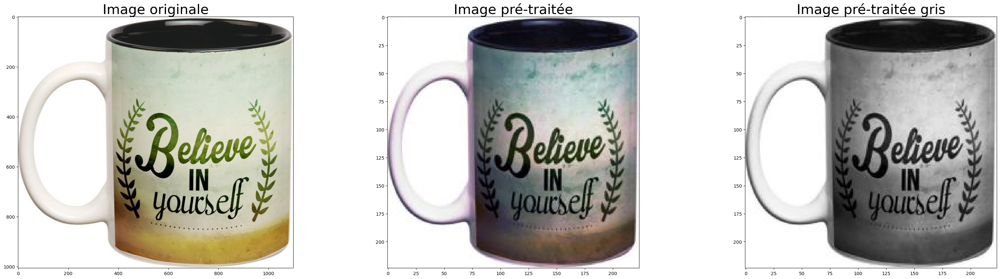

In [40]:
#Vérification
# Chargement de l'image d'origine
img_orig =imread('./data/data_1/Images/02127f52e96fb72c66bf081d25104ef8.jpg')
# Chargement de l'image précédemment traitée
img_process =imread('./data/data_1/Images/preprocess_image/02127f52e96fb72c66bf081d25104ef8.jpg')
# Chargement de l'image précédemment traitée en gris
img_process_gray =imread('./data/data_1/Images/preprocess_image_gray/02127f52e96fb72c66bf081d25104ef8.jpg')


plt.figure(figsize=(40, 10))

# Visualisation de l'image
plt.subplot(131)
plt.title('Image originale', fontsize=30)
plt.imshow(img_orig)

plt.subplot(132)
plt.title('Image pré-traitée', fontsize=30)
plt.imshow(img_process)

plt.subplot(133)
plt.title('Image pré-traitée gris', fontsize=30)
plt.imshow(img_process_gray, cmap='gray')


plt.show()




### Méthode SIFT

SIFT (scale-invariant feature transform), que l'on peut traduire par « transformation de caractéristiques visuelles invariante à l'échelle », est un algorithme utilisé pour détecter et identifier les éléments similaires entre différentes images numériques (éléments de paysages, objets, personnes, etc.). Il a été développé en 1999.


L'étape fondamentale de la méthode consiste à calculer ce que l'on appelle les « descripteurs SIFT » des images à étudier. Il s'agit d'informations numériques dérivées de l'analyse locale d'une image et qui caractérisent le contenu visuel de cette image de la façon la plus indépendante possible de l'échelle (« zoom » et résolution du capteur), du cadrage, de l'angle d'observation et de l'exposition (luminosité).


Ainsi, deux photographies d'un même objet auront toutes les chances d'avoir des descripteurs SIFT similaires, et ceci d'autant plus si les instants de prise de vue et les angles de vue sont proches.


Voici le protocole que l'on va mettre en place, pour créer notre moteur de classification des produits à partir des images avec SIFT :

         1- Pour chaque image du jeu de données
- lire l'image
- Réaliser le pre-processing de l'image pour augmenter la capacité de SIFT à détecter correctement les descripteurs
- Passer l'image en niveau de gris
- Extraction des descripteurs

        2- Création d'une matrice contenant l'ensemble des descripteurs
        3- Clustérisation pour création des Bag of Virtual Words
        4- Création des Histogrammes
        5- Réduction de dimension PCA + T-SNE
        6- Calcul du score ARI

In [41]:
def gen_sift_features(gray_img):
    sift = cv.SIFT_create()
    # kp is the keypoints
    # desc is the SIFT descriptors, they're 128-dimensional vectors
    # that we can use for our final features
    kp, desc = sift.detectAndCompute(gray_img, None)
    return kp, desc

In [42]:
# Extraction des keypoints et descripteurs SIFT
sift_keypoints, sift_descripteurs = gen_sift_features(img_process_gray)

print(f"L'image contient {sift_descripteurs.shape[0]} descripteurs SIFT")
print(f'Chaque descripteur est un vecteur de longueur {sift_descripteurs.shape[1]}')


L'image contient 324 descripteurs SIFT
Chaque descripteur est un vecteur de longueur 128


/tmp/ipykernel_177651/1509982843.py:8: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


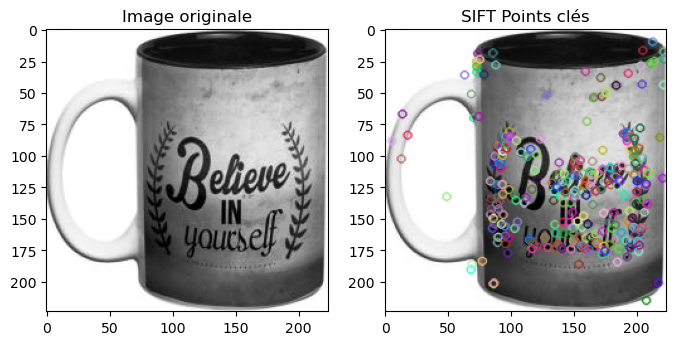

In [43]:
# Visualisation des points d'intérêt
sift_img_keypoints = cv.drawKeypoints(img_process_gray, sift_keypoints, None)

plt.figure(figsize=(8, 4))
plt.grid(False)

# Image originale
plt.subplot(1, 2, 1)
plt.grid(False)
plt.title('Image originale')
plt.imshow(img_process_gray, cmap='gray')

# Image avec les points clés
plt.subplot(1, 2, 2)
plt.grid(False)
plt.imshow(sift_img_keypoints)
plt.title('SIFT Points clés')

plt.show()

# Etape 1 : étude de faisabilité

In [44]:
descriptors_unclustered = []

In [45]:
sift = cv.SIFT_create(500)
for i in range(len(df_img.images_processed_gray)):
    image = cv.imread(df_img.images_processed_gray[i],0)
    kp, dsc = sift.detectAndCompute(image, None)
    descriptors_unclustered.append(dsc)

In [46]:
sift_keypoints_by_img = np.asarray(descriptors_unclustered, dtype=object)
sift_keypoints_all = np.concatenate(sift_keypoints_by_img, axis=0)

In [47]:
with tf.device('/gpu:0'):
    im_kmeans = MiniBatchKMeans(n_clusters=70, init_size=3*70, verbose=1).fit(sift_keypoints_all)

2023-05-21 21:24:24.640799: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-21 21:24:24.641013: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-21 21:24:24.641153: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

Init 1/3 with method k-means++
Inertia for init 1/3: 29289996.0
Init 2/3 with method k-means++
Inertia for init 2/3: 29410022.0
Init 3/3 with method k-means++
Inertia for init 3/3: 28773492.0
[MiniBatchKMeans] Reassigning 1 cluster centers.
Minibatch step 1/33397: mean batch inertia: 134946.234375
Minibatch step 2/33397: mean batch inertia: 94400.2421875, ewa inertia: 94400.2421875
[MiniBatchKMeans] Reassigning 1 cluster centers.
Minibatch step 3/33397: mean batch inertia: 93407.03125, ewa inertia: 94394.29439924765
Minibatch step 4/33397: mean batch inertia: 90836.3359375, ewa inertia: 94372.9877636256
Minibatch step 5/33397: mean batch inertia: 89539.3984375, ewa inertia: 94344.04208378542
Minibatch step 6/33397: mean batch inertia: 89047.6796875, ewa inertia: 94312.3251132493
Minibatch step 7/33397: mean batch inertia: 88312.671875, ewa inertia: 94276.3965247679
Minibatch step 8/33397: mean batch inertia: 88088.6484375, ewa inertia: 94239.3415407837
Minibatch step 9/33397: mean batc

Minibatch step 444/33397: mean batch inertia: 85501.9609375, ewa inertia: 86299.58543529244
Minibatch step 445/33397: mean batch inertia: 84901.59375, ewa inertia: 86291.21364012916
Minibatch step 446/33397: mean batch inertia: 85359.328125, ewa inertia: 86285.63309574513
Minibatch step 447/33397: mean batch inertia: 85499.6796875, ewa inertia: 86280.92645763638
Minibatch step 448/33397: mean batch inertia: 86357.8046875, ewa inertia: 86281.38683862412
Minibatch step 449/33397: mean batch inertia: 85881.6640625, ewa inertia: 86278.99312109417
Minibatch step 450/33397: mean batch inertia: 85259.9296875, ewa inertia: 86272.8905166122
Minibatch step 451/33397: mean batch inertia: 86208.6484375, ewa inertia: 86272.5058065078
Minibatch step 452/33397: mean batch inertia: 86930.2890625, ewa inertia: 86276.444904815
Minibatch step 453/33397: mean batch inertia: 84352.5625, ewa inertia: 86264.92384243617
Minibatch step 454/33397: mean batch inertia: 86197.125, ewa inertia: 86264.51783285318
Mi

In [48]:
def build_histogram(im_kmeans, des, image_num):
    res = im_kmeans.predict(des)
    hist = np.zeros(len(im_kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : 
        print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist

In [49]:
hist_vectors=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    hist = build_histogram(im_kmeans, image_desc, i) # calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

In [50]:
list_photos=df_img['images_processed_gray']
list_photos

0       ./data/data_1/Images/preprocess_image_gray/55b85ea15a1536d46b7190ad6fff8ce7.jpg
1       ./data/data_1/Images/preprocess_image_gray/7b72c92c2f6c40268628ec5f14c6d590.jpg
2       ./data/data_1/Images/preprocess_image_gray/64d5d4a258243731dc7bbb1eef49ad74.jpg
3       ./data/data_1/Images/preprocess_image_gray/d4684dcdc759dd9cdf41504698d737d8.jpg
4       ./data/data_1/Images/preprocess_image_gray/6325b6870c54cd47be6ebfbffa620ec7.jpg
                                             ...                                       
1045    ./data/data_1/Images/preprocess_image_gray/958f54f4c46b53c8a0a9b8167d9140bc.jpg
1046    ./data/data_1/Images/preprocess_image_gray/fd6cbcc22efb6b761bd564c28928483c.jpg
1047    ./data/data_1/Images/preprocess_image_gray/5912e037d12774bb73a2048f35a00009.jpg
1048    ./data/data_1/Images/preprocess_image_gray/c3edc504d1b4f0ba6224fa53a43a7ad6.jpg
1049    ./data/data_1/Images/preprocess_image_gray/f2f027ad6a6df617c9f125173da71e44.jpg
Name: images_processed_gray, Len

In [51]:
k = int(round(np.sqrt(len(sift_keypoints_all)),0))
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(sift_keypoints_all)

Nombre de clusters estimés :  585
Création de 585 clusters de descripteurs ...


MiniBatchKMeans(init_size=1755, n_clusters=585, random_state=0)

In [52]:
print("Dimensions dataset avant réduction PCA : ", im_features.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_img= pca.fit_transform(im_features)
print("Dimensions dataset après réduction PCA : ", pca_results_img.shape)

Dimensions dataset avant réduction PCA :  (1050, 70)
Dimensions dataset après réduction PCA :  (1050, 63)


In [53]:
df_img.shape

(1050, 10)

In [54]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_img = tsne.fit_transform(pca_results_img)

df_tsne_img = pd.DataFrame(tsne_results_img[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_img["class"] = df_img["cat_lvl_1"]
print(df_tsne_img.shape)

(1050, 3)


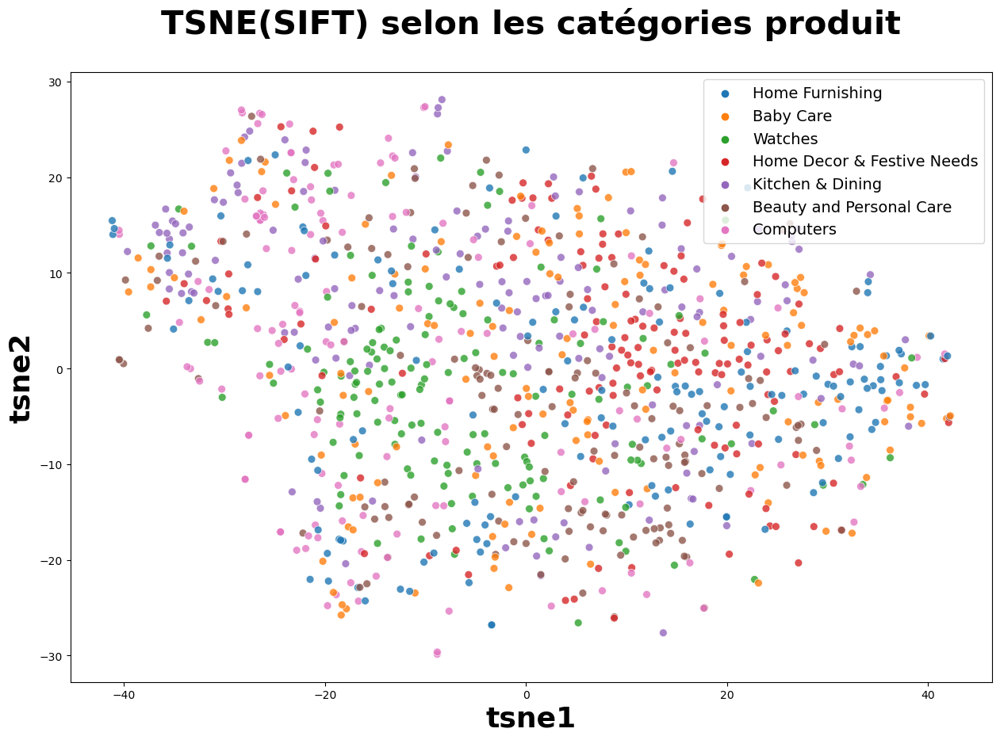

In [55]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_img, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE(SIFT) selon les catégories produit', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

In [56]:
#Création de clusters à partir du T-SNE 
X = df_tsne_img[["tsne1","tsne2"]]

cls = KMeans(n_clusters=7, init='k-means++', random_state=0)
cls.fit(X)

df_tsne_img["cluster"] = cls.labels_

sil = silhouette_score(X,cls.labels_,metric="euclidean")
print("Le score de silhouette est", sil)

Le score de silhouette est 0.3646041


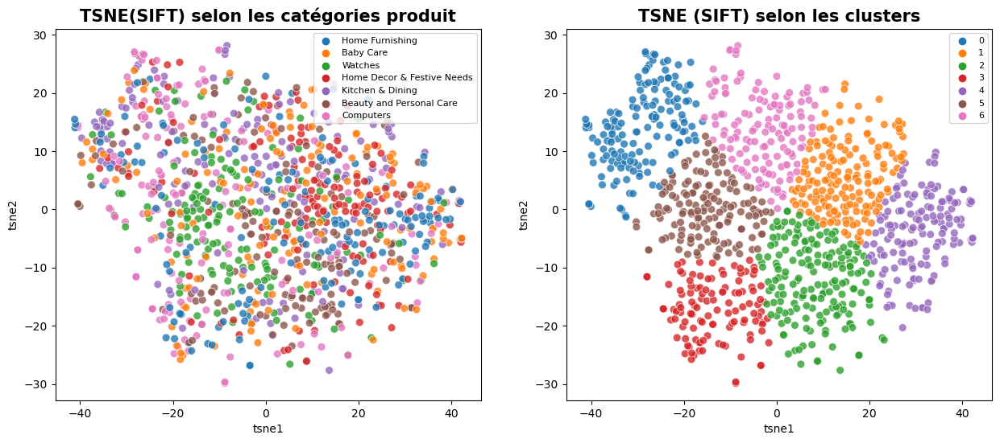

ARI :  0.04653239163296941


In [57]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    

sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_img, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE(SIFT) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 



ax = fig.add_subplot(122)
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_img,
    legend="brief")

plt.title('TSNE (SIFT) selon les clusters', fontsize =15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()


print("=================================")
labels = df_img["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))
print("==================================")


In [58]:
# Fonction pour afficher la répartition des vraies catégories par cluster

def plot_clust_vs_cat(ser_clust, ser_cat, data, figsize=(8,4),
                                  palette='tab10', ylim=(0,250),
                                  bboxtoanchor=None):
    
    # pivot = data.drop(columns=['description','image'])
    pivot = pd.DataFrame()
    pivot['label']=ser_clust
    pivot['category']=ser_cat
    pivot['count']=1
    pivot = pivot.groupby(by=['label','category']).count().unstack().fillna(0)
    pivot.columns=pivot.columns.droplevel()
    
    colors = sns.color_palette(palette, ser_clust.shape[0]).as_hex()
    pivot.plot.bar(width=0.8,stacked=True,legend=True,figsize=figsize,
                   color=colors, ec='k')

    row_data=data.shape[0]

    if ser_clust.nunique() > 15:
        font = 8 
    else : 
        font = 12

    for index, value in enumerate(ser_clust.value_counts().sort_index(ascending=True)):
        percentage = np.around(value/row_data*100,1)   
        plt.text(index-0.25, value+2, str(percentage)+' %',fontsize=font)

    plt.gca().set(ylim=ylim)
    plt.xticks(rotation=0) 

    plt.xlabel('Clusters',fontsize=14)
    plt.ylabel('Nombre de produits', fontsize=14)
    plt.title('Répartition des vraies catégories par cluster',
              fontweight='bold', fontsize=18)

    if bboxtoanchor is not None:
        plt.legend(bbox_to_anchor=bboxtoanchor)
        
    plt.show()    
    
    return pivot

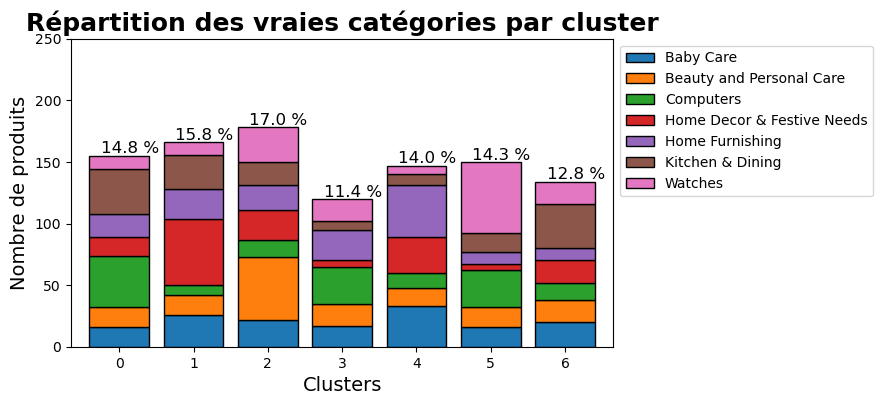

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,16,16,42,15,19,36,11
1,26,16,8,54,24,28,10
2,22,51,14,24,20,19,28
3,17,18,30,5,25,7,18
4,33,15,12,29,42,9,7
5,16,16,30,5,10,15,58
6,20,18,14,18,10,36,18


In [59]:
plot_clust_vs_cat( df_tsne_img["cluster"],
                               df_tsne_img["class"],
                               df_tsne_img,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,250))

In [60]:
# Affiche la matrice de confusion

def confusion_matrix(y_true, y_pred, title):
    """ xxx
    Args:
        y_true list(str):
        y_pred list(int):
        title (str): 
    Returns:
        -
    """
    # Create a DataFrame with labels and varieties as columns: df
    df = pd.DataFrame({'Labels': y_true, 'Clusters': y_pred})

    # Create crosstab: ct
    ct = pd.crosstab(df['Labels'], df['Clusters'])

    # plot the heatmap for correlation matrix
    fig, ax = plt.subplots(figsize=(10, 8))

    sns.heatmap(ct.T, 
                 square=True, 
                 annot=True, 
                 annot_kws={"size": 17},
                 fmt='.2f',
                 cmap='Blues',
                 cbar=False,
                 ax=ax)

    ax.set_title(title, fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=12)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, ha="right", fontsize=12)
    ax.set_ylabel("clusters", fontsize=15)
    ax.set_xlabel("labels", fontsize=15)

    plt.show()

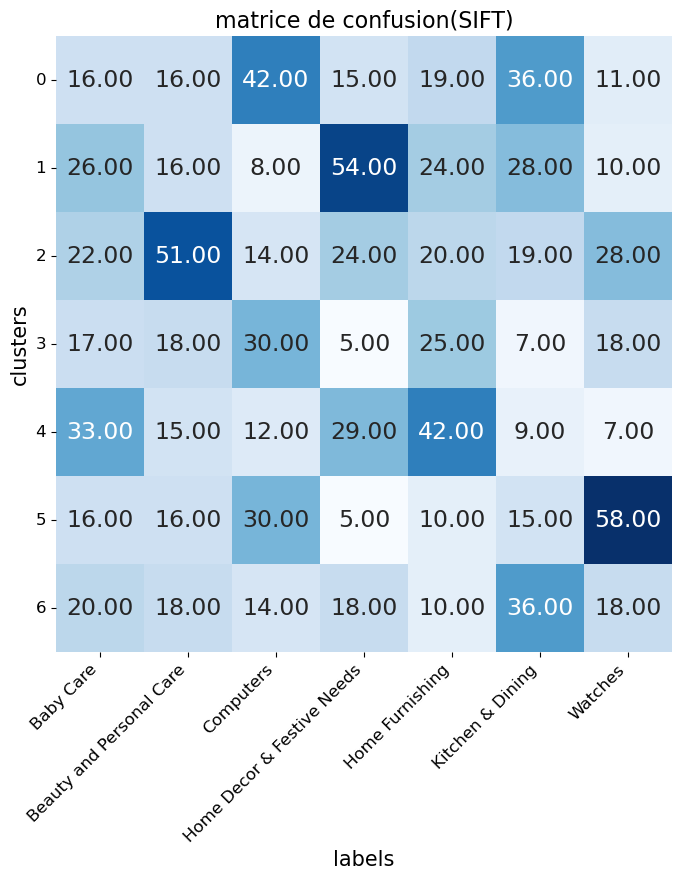

In [61]:
confusion_matrix(df_tsne_img["class"], df_tsne_img["cluster"], 'matrice de confusion(SIFT)')


### Création du modèle pré-entraîné VGG16

In [62]:
# Utilisation de VGG16 pré-entraîné sur ImageNet avec les images d'origine

# Instanciation du modèle
model_vgg16 = VGG16()

# Remove the output layer
with tf.device('/gpu:0'):
    model_vgg16= Model(inputs=model_vgg16.inputs, outputs=model_vgg16.layers[-2].output)

# Résumé de l'architecture du modèle
model_vgg16.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

2023-05-21 21:24:38.562608: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 411041792 exceeds 10% of free system memory.


### Création des features des images

In [63]:
# Liste
vgg16_all_features = []
i = 0
for rep_image in df_img['images_processed']:
    if i%100 == 0 : print(i)
    i +=1

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = load_img(rep_image, target_size=(224, 224))
    
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = img_to_array(img)
    
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    
    # Préparer de nouvelles entrées pour le réseau. 
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    vgg16_feature = model_vgg16.predict(img, verbose=0)
    
    # Ajouter la feature prédite en nparray à la liste
    vgg16_all_features.append(np.array(vgg16_feature).flatten())

0


2023-05-21 21:24:40.593433: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8801


100
200
300
400
500
600
700
800
900
1000


In [64]:
vgg16_all_features = np.array(vgg16_all_features)

In [65]:
df_img.loc[:]['vgg16_bovw'] = [vgg16_all_features[i] for i in range(df_img.shape[0])]
df_vgg16_vectors = pd.DataFrame.from_records(vgg16_all_features)

### Réduction de dimension PCA

In [66]:
print("Dimensions dataset avant réduction PCA : ", df_vgg16_vectors.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_vgg16 = pca.fit_transform(df_vgg16_vectors)
print("Dimensions dataset après réduction PCA : ", pca_results_vgg16.shape)

Dimensions dataset avant réduction PCA :  (1050, 4096)
Dimensions dataset après réduction PCA :  (1050, 819)


### Réduction de dimension T-SNE et affichage des images selon vraies classes

In [67]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_vgg16 = tsne.fit_transform(pca_results_vgg16)

df_tsne_vgg16 = pd.DataFrame(tsne_results_vgg16[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_vgg16["class"] =df_img["cat_lvl_1"]
print(df_tsne_vgg16.shape)

(1050, 3)


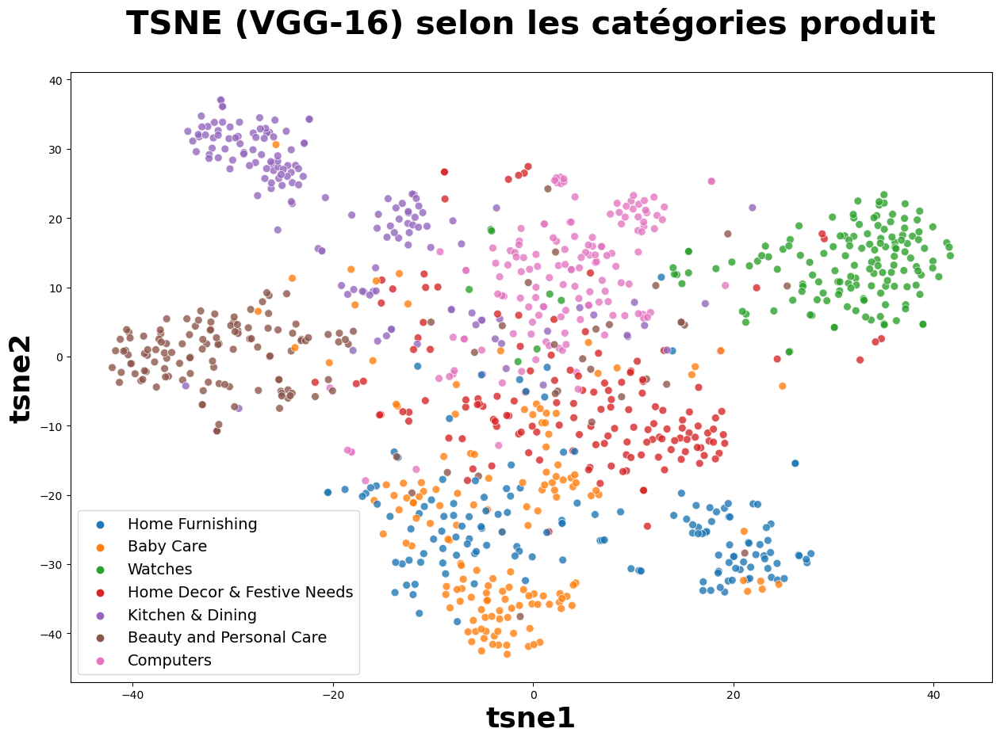

In [68]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_vgg16, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (VGG-16) selon les catégories produit', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

In [69]:
#Création de clusters à partir du T-SNE 
X = df_tsne_vgg16[["tsne1","tsne2"]]

cls = KMeans(n_clusters=7, init='k-means++', random_state=0)
cls.fit(X)

df_tsne_vgg16["cluster"] = cls.labels_

sil = silhouette_score(X,cls.labels_,metric="euclidean")
print("Le score de silhouette est", sil)

Le score de silhouette est 0.4705042


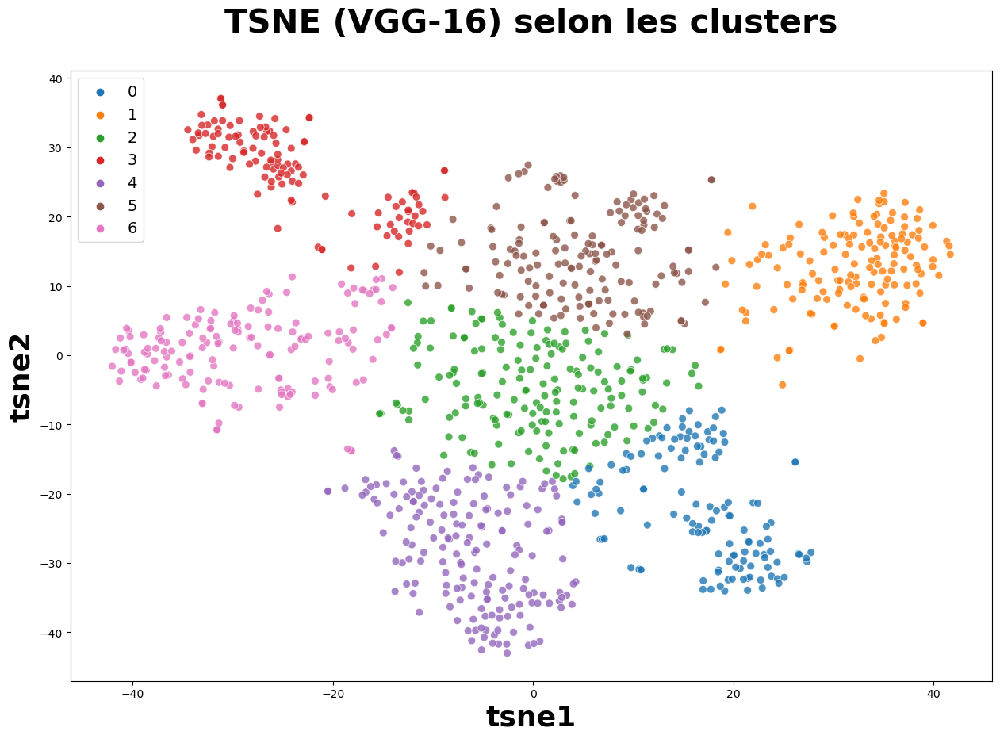

ARI :  0.47634353976308086


In [70]:
#Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_vgg16,
    legend="brief")

plt.title('TSNE (VGG-16) selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = df_img["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

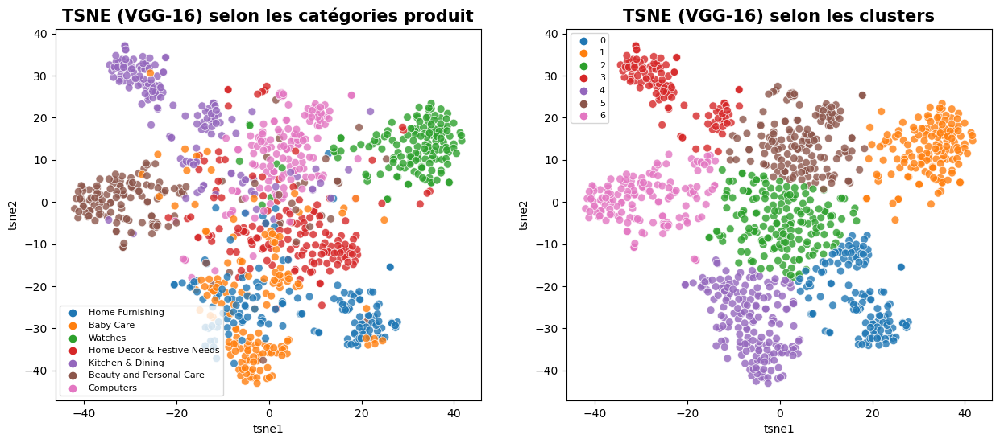

ARI :  0.47634353976308086


In [71]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    

sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_vgg16, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (VGG-16) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 



ax = fig.add_subplot(122)
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_vgg16,
    legend="brief")

plt.title('TSNE (VGG-16) selon les clusters', fontsize = 15 , fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()


print("===============================")
labels = df_img["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))
print("================================")

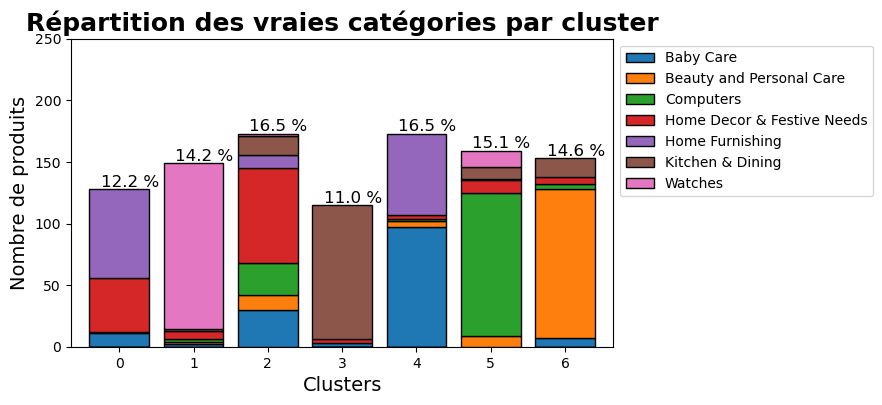

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,11.0,1.0,0.0,44.0,72.0,0.0,0.0
1,2.0,2.0,2.0,7.0,0.0,1.0,135.0
2,30.0,12.0,26.0,77.0,11.0,15.0,2.0
3,3.0,0.0,0.0,3.0,0.0,109.0,0.0
4,97.0,5.0,2.0,3.0,66.0,0.0,0.0
5,0.0,9.0,116.0,10.0,1.0,10.0,13.0
6,7.0,121.0,4.0,6.0,0.0,15.0,0.0


In [72]:
plot_clust_vs_cat( df_tsne_vgg16["cluster"],
                               df_tsne_vgg16["class"],
                              df_tsne_vgg16,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,250))

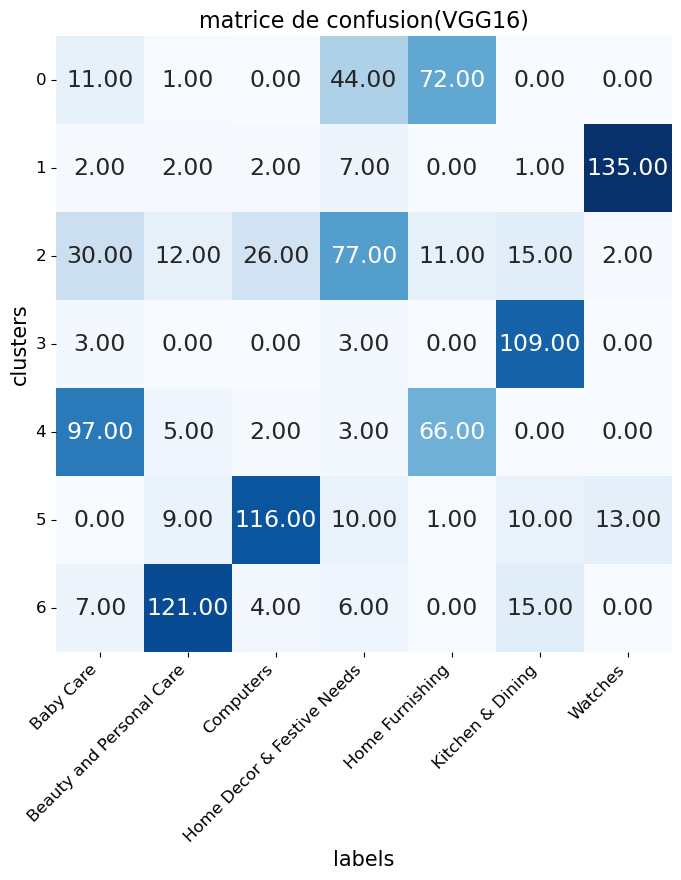

In [73]:
confusion_matrix(df_tsne_vgg16["class"], df_tsne_vgg16["cluster"], 'matrice de confusion(VGG16)')

###### Préparation de nos données pour les modèles de classification

In [74]:
rs = ShuffleSplit(n_splits=2, test_size=.25, random_state=0)
rs.get_n_splits(df_img)

2

In [75]:
for i, (train_index, test_index) in enumerate(rs.split(df_img, df_img['cat_lvl_1'] )):
    data_train = df_img.iloc[train_index]
    data_test = df_img.iloc[test_index]

In [76]:
data_train.shape,data_test.shape

((787, 10), (263, 10))

In [77]:
path = "./data/data_1/dataset_train/"
path_test = "./data/data_1/dataset_test/"
data_train.to_csv(path+'data_train.csv', index=False)
data_test.to_csv(path_test+'data_test.csv', index=False)